In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T
from torchvision import models

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_image(img_path, max_size=400, shape=None):
    image = Image.open(img_path).convert('RGB')
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    transform = T.Compose([
        T.Resize(size),
        T.ToTensor(),
        T.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])
    # Add batch dimension and move to device
    return transform(image)[:3,:,:].unsqueeze(0).to(device)

def im_convert(tensor):
    """ Converts a PyTorch tensor to a displayable PIL image. """
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze().transpose(1, 2, 0)
    image = image * [0.224, 0.224, 0.225] + [0.485, 0.456, 0.406]
    return image.clip(0, 1)

In [2]:
device

device(type='cuda')

In [3]:
def gram_matrix(tensor):
    """ Calculates the Gram Matrix (correlations) of a feature map. """
    _, d, h, w = tensor.size()
    # Flatten the spatial dimensions
    tensor = tensor.view(d, h * w)
    # Dot product of the matrix with its transpose
    gram = torch.mm(tensor, tensor.t())
    return gram

class StyleExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        # Layers for Style (textures) and Content (objects)
        self.vgg = models.vgg19(weights='DEFAULT').features.to(device).eval()
        self.layers = {
            '0': 'conv1_1', '5': 'conv2_1',
            '10': 'conv3_1', '19': 'conv4_1',
            '21': 'conv4_2', # content layer
            '28': 'conv5_1'
        }
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, x):
        features = {}
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.layers:
                features[self.layers[name]] = x
        return features

In [4]:
def run_style_transfer(content_img, style_img, iterations=2000):
    # The image we will change (start with a copy of content)
    target = content_img.clone().requires_grad_(True).to(device)

    extractor = StyleExtractor()
    content_features = extractor(content_img)
    style_features = extractor(style_img)

    # Pre-calculate Gram Matrices for the style image
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # Weights for different layers (earlier layers = bigger brushstrokes)
    style_weights = {'conv1_1': 1.0, 'conv2_1': 0.75, 'conv3_1': 0.2, 'conv4_1': 0.2, 'conv5_1': 0.2}
    content_weight = 1  # Alpha
    style_weight = 1e6 # Beta

    optimizer = optim.Adam([target], lr=0.003)

    for i in range(1, iterations + 1):
        target_features = extractor(target)

        # 1. Content Loss
        c_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

        # 2. Style Loss
        s_loss = 0
        for layer in style_weights:
            target_gram = gram_matrix(target_features[layer])
            style_gram = style_grams[layer]
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            _, d, h, w = target_features[layer].shape
            s_loss += layer_style_loss / (d * h * w)

        # 3. Total Loss
        total_loss = content_weight * c_loss + style_weight * s_loss

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if i % 500 == 0:
            print(f"Iteration {i}: Total Loss: {total_loss.item()}")
            plt.imshow(im_convert(target))
            plt.title(f"Target at Iteration {i}")
            plt.show()

    return target

Iteration 500: Total Loss: 14802819.0


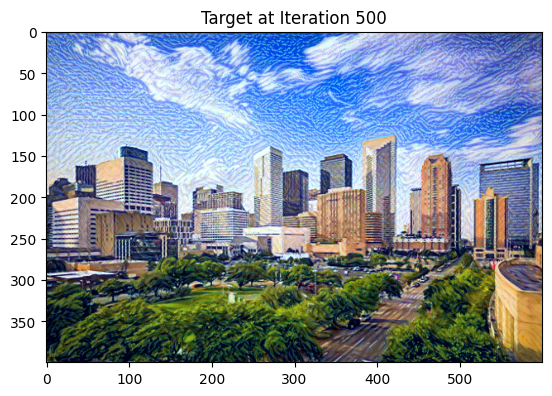

Iteration 1000: Total Loss: 4379676.0


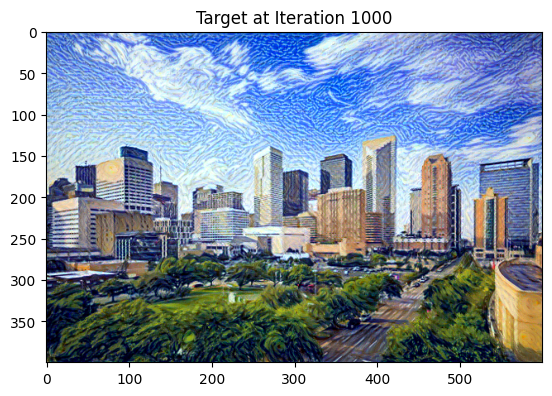

Iteration 1500: Total Loss: 2007578.5


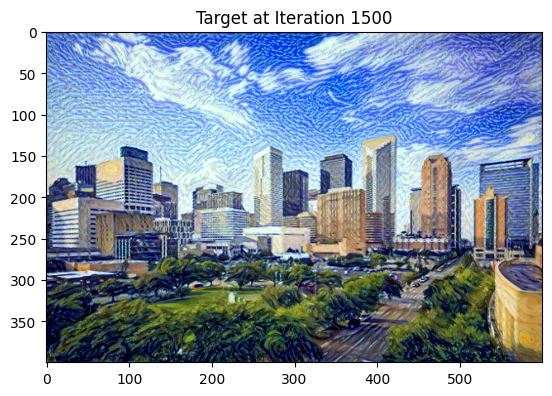

Iteration 2000: Total Loss: 1182181.5


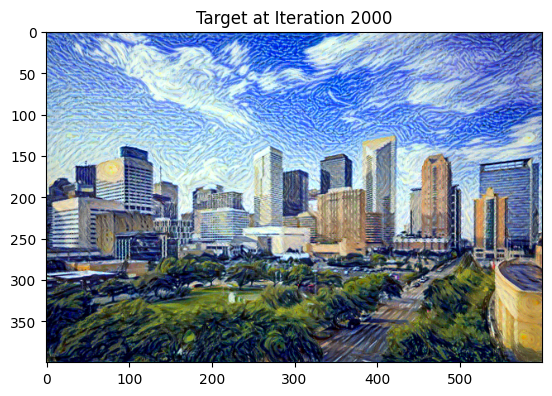

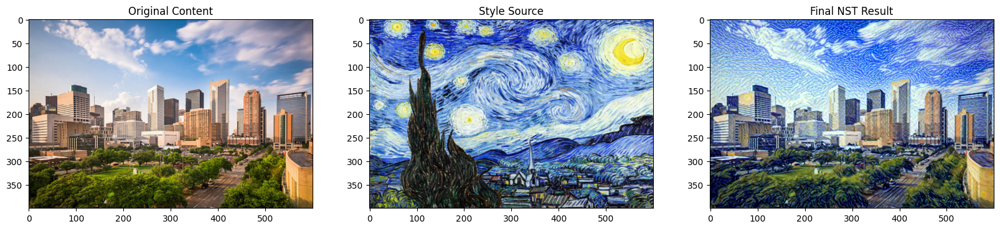

In [ ]:
# 1. Load your images
content = load_image('c1.jpg')
style = load_image('s3.jpg', shape=content.shape[-2:])

# 2. Run the process
result = run_style_transfer(content, style)

# 3. Show Final Evaluation
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title("Original Content")
ax2.imshow(im_convert(style))
ax2.set_title("Style Source")
ax3.imshow(im_convert(result))
ax3.set_title("Final NST Result")
plt.show()

Iteration 500: Total Loss: 623532416.0


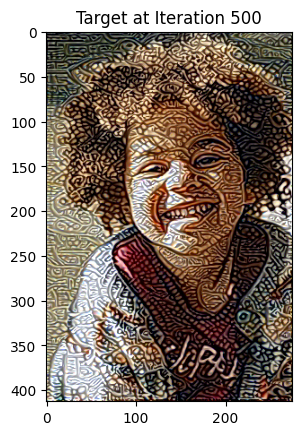

Iteration 1000: Total Loss: 116521816.0


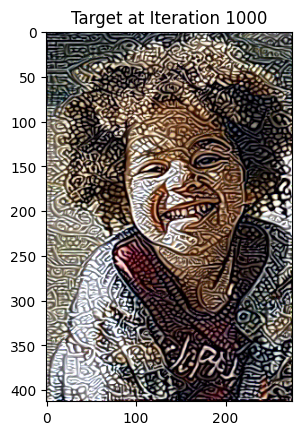

Iteration 1500: Total Loss: 58368588.0


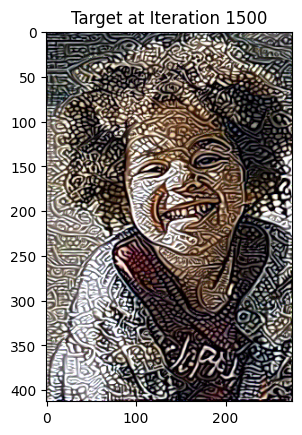

Iteration 2000: Total Loss: 36643440.0


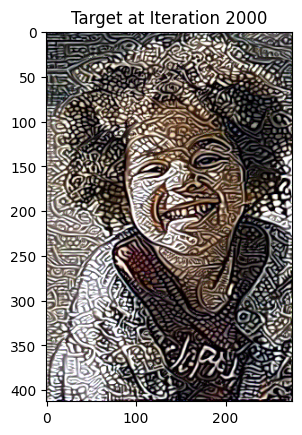

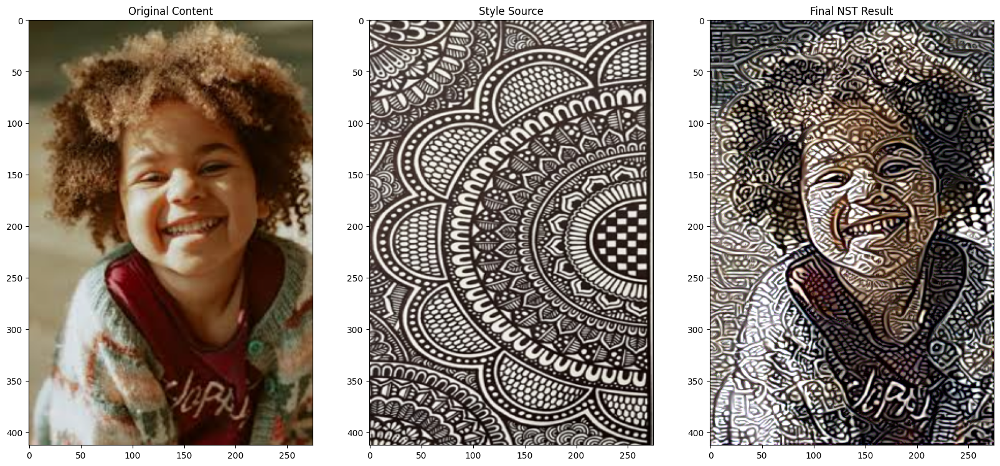

In [ ]:
# 1. Load your images
content = load_image('c2.jpg')
style = load_image('s4(mandala art).jpg', shape=content.shape[-2:])

# 2. Run the process
result = run_style_transfer(content, style)

# 3. Show Final Evaluation
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title("Original Content")
ax2.imshow(im_convert(style))
ax2.set_title("Style Source")
ax3.imshow(im_convert(result))
ax3.set_title("Final NST Result")
plt.show()

Iteration 500: Total Loss: 751225792.0


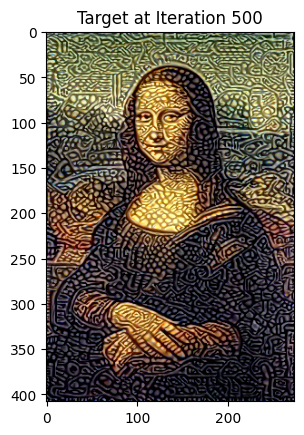

Iteration 1000: Total Loss: 175092224.0


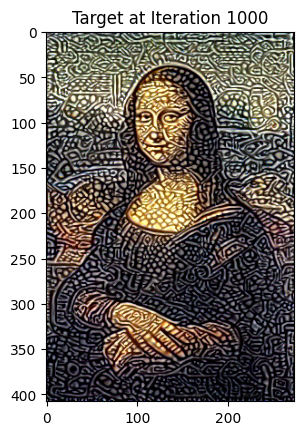

Iteration 1500: Total Loss: 84226152.0


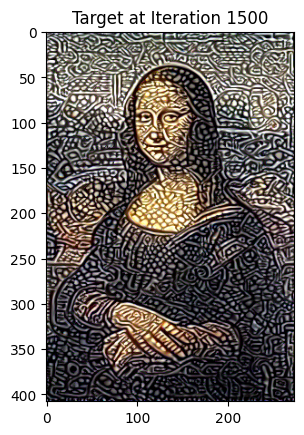

Iteration 2000: Total Loss: 49457212.0


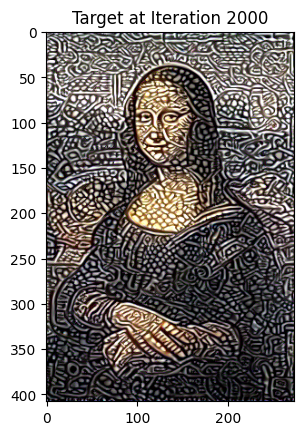

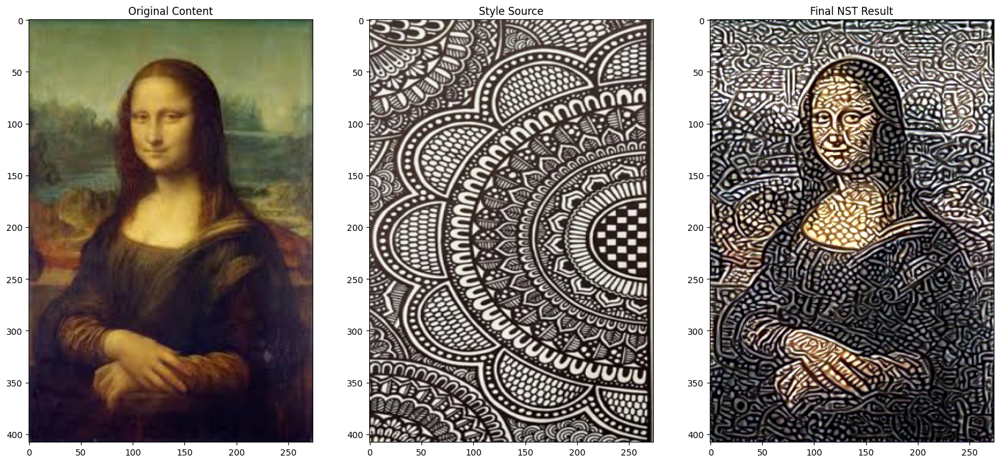

In [ ]:
# 1. Load your images
content = load_image('c3.jpg')
style = load_image('s4(mandala art).jpg', shape=content.shape[-2:])

# 2. Run the process
result = run_style_transfer(content, style)

# 3. Show Final Evaluation
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title("Original Content")
ax2.imshow(im_convert(style))
ax2.set_title("Style Source")
ax3.imshow(im_convert(result))
ax3.set_title("Final NST Result")
plt.show()